This notebook contains the code for:
- feature engineering 
- dimensionality reduction using UMAP
- clustering using HDBSCAN

In [105]:
import numpy as np     
import pandas as pd

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import random

In [4]:
import umap
import hdbscan

In [5]:
import joblib 
from joblib import Parallel, delayed

In [6]:
from sklearn.decomposition import PCA

In [7]:
import sys
sys.path.append('../../utils/')

In [8]:
from wavelets import get_wv_parameters, wv_transform

In [9]:
from sklearn.preprocessing import MinMaxScaler

# Load metadata

In [10]:
df_meta = pd.read_pickle('../../../data/amphioxus_metadata_final500.pickle')

In [11]:
# create a filename column to match with the filename column in the dataset
df_meta['filename'] = df_meta['filename_video'].apply(lambda x: x.split('.avi')[0])

In [12]:
len(df_meta.filename.unique())

500

# Load the data (postural and kineamtic features computed from DLC tracking)

In [13]:
df = pd.read_hdf('../../../results/featureset_v4_29072023.h5', key='features')

# Get features from wildtype (control) animals

In [ ]:
df_merged = df.merge(df_meta, how='left', on='filename')

In [ ]:
df_control = df_merged[(df_merged['age'] > 50)&(df_merged['drugs']=='none')&(df_merged['light']=='None')]

In [ ]:
print(f'Number of control/ wildtype videos :{len(df_control.filename.unique())}')

# Selecting features to be used for analysis

## Speeds

In [14]:
df_speeds = df.filter(like='speed')
df_speeds.shape

(4865950, 27)

In [15]:
df_speeds = df_speeds.fillna(value=-1) # Nan masking

In [16]:
df_speeds.shape

(4865950, 27)

## Using curvatures (curvatures have been computed for dorsal points only)

In [17]:
df_curv = df.filter(like='curv')
df_curv.shape

(4865950, 15)

How to use curvatures in the analysis? 
- We would like to encode the temporal dynamics (how does the curvatures change along time?)
- One obvious way to do it is to use wavelets which can encode multiresolution - spatial and temporal features
- Then the question becomes, how do we use the curvatures? 
    1. Option 1: Compute wavelets for all 15 curvature points.
    2. Option 2: First use PCA to capture much of the variance in curvatures. Will that suffice? 

### Try PCA ~ akin to eigen cionas, eigen worms etc

In [18]:
pca = PCA()
pca_curv = pca.fit_transform(df_curv)
pca_curv.shape

(4865950, 15)

Text(0, 0.5, 'variance explained')

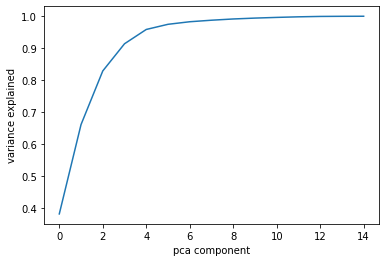

In [19]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('pca component')
plt.ylabel('variance explained')

In [20]:
np.cumsum(pca.explained_variance_ratio_)

array([0.3814321 , 0.66102791, 0.82881798, 0.91388668, 0.95862723,
       0.97477707, 0.98278344, 0.98756674, 0.99146266, 0.99421718,
       0.9963731 , 0.9981855 , 0.99940137, 0.99980822, 1.        ])

In [21]:
np.where(np.cumsum(pca.explained_variance_ratio_)<0.98)

(array([0, 1, 2, 3, 4, 5]),)

if we use the first 6 pca components, it can explain > 97% of the variance in the data

In [22]:
for i in range(6):
    df[f'pca_{i}'] = pca_curv[:,i]

### Compute wavelet transforms

In [23]:
# Wavelet features has to be computed for each file

df_files = df.groupby(by = 'filename')

df_pca_feats = []
pca_feats = [f'pca_{i}' for i in range(6)]

for fn, group in df_files:
    df_pca_feats.append(group.filter(items = pca_feats + ['filename', 'frame']))

In [24]:
omg0, widths = get_wv_parameters()

In [25]:
df_wv_transforms = Parallel(n_jobs=40, verbose = 5)(delayed(wv_transform)(df, widths, omg0) 
                                                for df in df_pca_feats)

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

s.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmen

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor perf

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor perf

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highlIOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

[Parallel(n_jobs=40)]: Done 497 out of 497 | elapsed:   16.3s finished


In [26]:
df_wavelets = pd.concat(df_wv_transforms)

In [27]:
df_wavelets.shape

(4865950, 182)

# UMAP

## for speeds

In [ ]:
reducer_speeds = umap.UMAP(n_jobs=40) # assuming euclidean metrics will do fine

In [ ]:
embedding_speeds = reducer_speeds.fit_transform(df_speeds.values)
embedding_speeds.shape

In [ ]:
fn_model_speeds = f'../../../results/umap_model_speeds_17082023_all.joblib'
joblib.dump(reducer_speeds, fn_model_speeds)

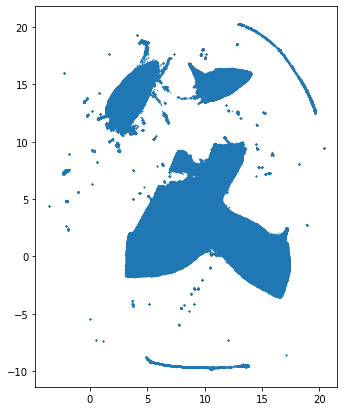

In [35]:
fig, axes = plt.subplots(1,1, figsize=(15,7))
axes.scatter(embedding_speeds[:, 0],embedding_speeds[:, 1], s=0.2)
axes.set_aspect('equal')

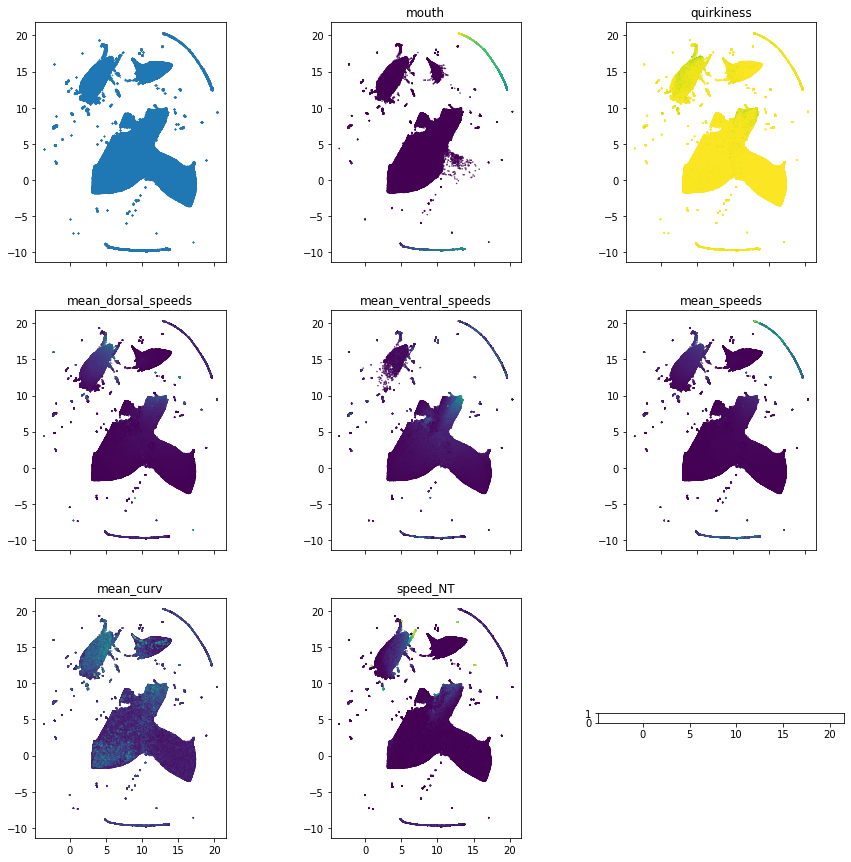

In [106]:
fig, axes = plt.subplots(3,3, figsize=(15,15), sharex=True)
axes= axes.ravel()
axes[0].scatter(embedding_speeds[:, 0],embedding_speeds[:, 1], s=0.2)

hue_feats = {'mouth': df['speed_MOUTH'],
             'quirkiness': df['quirkiness'],
             'mean_dorsal_speeds': df.filter(like='speed_D').mean(axis=1),
             'mean_ventral_speeds': df.filter(like='speed_V').mean(axis=1),
             'mean_ventral_speeds': df.filter(like='speed_V').mean(axis=1),
             'mean_speeds': df.filter(like='speed_').mean(axis=1),
#              'length': df['len_sum_of_parts'],
             'mean_curv': df.filter(like='curv').abs().mean(axis=1),
             'speed_NT': df['speed_NT'],
            }

for i, key_hue in enumerate(hue_feats.keys()):
    axes[i+1].scatter(embedding_speeds[:, 0],embedding_speeds[:, 1], c= hue_feats[key_hue], s=0.2)
    axes[i+1].set_title(key_hue)
for ax in axes:  
    ax.set_aspect('equal')
fig.savefig('../../../results/umap_speeds_25082023_all.png')

## for wavelets (curvatures)

In [ ]:
df_wavelets.filter(like='wv').shape

In [ ]:
reducer_wavelets = umap.UMAP(n_jobs=40)

In [ ]:
embedding_wavelets = reducer_wavelets.fit_transform(df_wavelets.filter(like='wv').values)
embedding_wavelets.shape

In [ ]:
fn_model_wavelets = f'../../../results/umap_model_wavelets_18082023_all.joblib'
joblib.dump(reducer_wavelets, fn_model_wavelets)

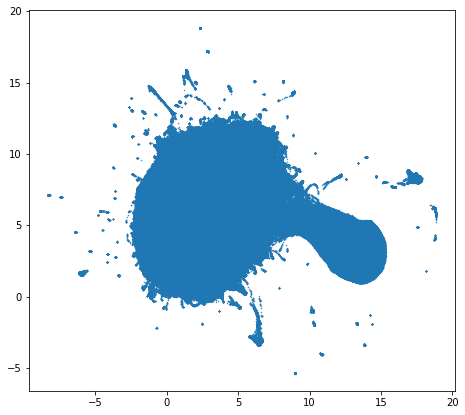

In [37]:
fig, axes = plt.subplots(1,1, figsize=(15,7))
axes.scatter(embedding_wavelets[:, 0],embedding_wavelets[:, 1], s=0.2)
axes.set_aspect('equal')

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highl

/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]
/work/athira/behavior_projects/behavior_amphioxus/codebase/notebooks/clustering/../../utils/wavelets.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_wv[f'{feat}_wv{f}'] = wv_feat[f-1,:]


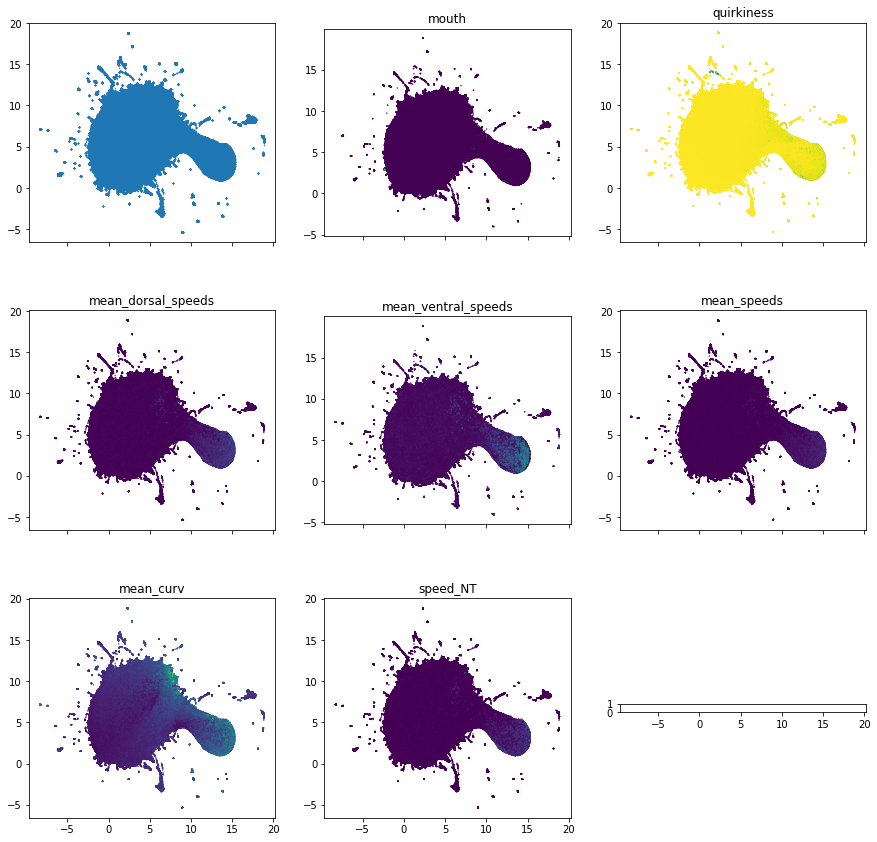

In [38]:
fig, axes = plt.subplots(3,3, figsize=(15,15), sharex=True)
axes= axes.ravel()
axes[0].scatter(embedding_wavelets[:, 0],embedding_wavelets[:, 1], s=0.2)

hue_feats = {'mouth': df['speed_MOUTH'],
             'quirkiness': df['quirkiness'],
             'mean_dorsal_speeds': df.filter(like='speed_D').mean(axis=1),
             'mean_ventral_speeds': df.filter(like='speed_V').mean(axis=1),
             'mean_speeds': df.filter(like='speed_').mean(axis=1),
#              'length': df['len_sum_of_parts'],
             'mean_curv': df.filter(like='curv').abs().mean(axis=1),
             'speed_NT': df['speed_NT'],
            }

for i, key_hue in enumerate(hue_feats.keys()):
    axes[i+1].scatter(embedding_wavelets[:, 0],embedding_wavelets[:, 1], c= hue_feats[key_hue], s=0.2)
    axes[i+1].set_title(key_hue)
for ax in axes:  
    ax.set_aspect('equal')
# fig.savefig('../../../results/umap_wavelets_18082023_all.png')

# Clustering 

In [54]:
c_pal = sns.color_palette('tab10', 10)

## naive HDBSCAN clustering

In [59]:
embedding_4d = np.hstack([embedding_speeds, embedding_wavelets])
embedding_4d.shape

(4865950, 4)

In [ ]:
clusterer_naive = hdbscan.HDBSCAN(
    min_samples= 1, #larger values implies more points considered as noise
    min_cluster_size= 10000, #smallest size grouping to be considered as a cluster
    cluster_selection_epsilon=1,
    prediction_data=True, 
    )

In [ ]:
labels_naive = clusterer_naive.fit_predict(embedding_4d)

In [ ]:
dict_clusters_naive = {f'cluster_{i}':np.sum(labels_naive==i) for i in list(np.unique(labels_naive))}
dict_clusters_naive

In [ ]:
c_dict = {i: c_pal[i+1] for i in np.unique(labels_naive)}
labels_c = [c_dict[lab] for lab in labels_naive]

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(15,7))
axes= axes.ravel()
axes[0].scatter(
    embedding_speeds[:, 0],
    embedding_speeds[:, 1], c=labels_c, s=1)
axes[1].scatter(
    embedding_wavelets[:, 0],
    embedding_wavelets[:, 1], c=labels_c, s=1)

markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in c_dict.values()]
plt.legend(markers, c_dict.keys(), numpoints=1)

for ax in axes:
    ax.set_aspect('equal')
# fig.savefig('../../../results/clusters_on_embedding4d_18082023_all.png')

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(15,7))
axes[0].scatter(embedding_speeds[:, 0],embedding_speeds[:, 1], c=embedding_wavelets[:,0], cmap='jet', s=0.2)
axes[1].scatter(embedding_speeds[:, 0],embedding_speeds[:, 1], c=embedding_wavelets[:,1], cmap='jet', s=0.2)
for ax in axes:
    ax.set_aspect('equal')
# fig.savefig('../../../results/umap_speed_colored_by_umap_wavelets_18082023_all.png')

## HDBSCAN (with scaling of inputs)

In [40]:
embedding_4d_scaled = MinMaxScaler().fit_transform(embedding_4d)

In [41]:
for i in range(embedding_4d_scaled.shape[1]):
    feat_max  = np.max(embedding_4d_scaled[:,i])
    print(feat_max)

1.0
1.0
1.0
0.99999994


In [50]:
clusterer_scaled = hdbscan.HDBSCAN(
    min_samples= 1, #larger values implies more points considered as noise
    min_cluster_size= 10000, #smallest size grouping to be considered as a cluster
    cluster_selection_epsilon=0.01,
    cluster_selection_method='leaf',
    prediction_data=True, 
    )

In [51]:
labels_scaled = clusterer_scaled.fit_predict(embedding_4d_scaled)

In [ ]:
filename_hdbscan = f'../../../results/hdbscan_4Dumap_model_18082023a_all.joblib'
joblib.dump(clusterer_scaled, filename_hdbscan)

In [52]:
dict_clusters_scaled = {f'cluster_{i}':np.sum(labels_scaled==i) for i in list(np.unique(labels_scaled))}
dict_clusters_scaled

{'cluster_-1': 38611,
 'cluster_0': 12849,
 'cluster_1': 10282,
 'cluster_2': 3914318,
 'cluster_3': 586397,
 'cluster_4': 303493}

In [53]:
dict_clusters_scaled = {f'cluster_{i}':np.sum(labels_scaled==i) for i in list(np.unique(labels_scaled))}
dict_clusters_scaled

{'cluster_-1': 38611,
 'cluster_0': 12849,
 'cluster_1': 10282,
 'cluster_2': 3914318,
 'cluster_3': 586397,
 'cluster_4': 303493}

In [47]:
c_pal = sns.color_palette('rainbow', 40)

In [55]:
c_dict_scaled = {i: c_pal[i+1] for i in np.unique(labels_scaled)}
labels_c_scaled = [c_dict_scaled[lab] for lab in labels_scaled]

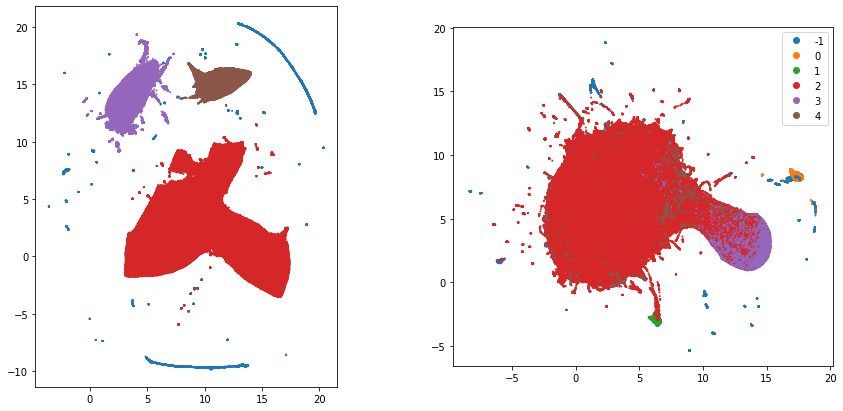

In [107]:
fig, axes = plt.subplots(1,2, figsize=(15,7))
axes= axes.ravel()
axes[0].scatter(
    embedding_speeds[:, 0],
    embedding_speeds[:, 1], c=labels_c_scaled, s=1)
axes[1].scatter(
    embedding_wavelets[:, 0],
    embedding_wavelets[:, 1], c=labels_c_scaled, s=1)

markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in c_dict_scaled.values()]
plt.legend(markers, c_dict_scaled.keys(), numpoints=1)

for ax in axes:
    ax.set_aspect('equal')
    
fig.savefig('../../../results/cluster_umap4dscaled_25082023_all.png')

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(15,7))
axes= axes.ravel()
axes[0].hist2d(
    embedding_speeds[:, 0],
    embedding_speeds[:, 1], bins=(150,150), density=True)
axes[1].hist2d(
    embedding_wavelets[:, 0],
    embedding_wavelets[:, 1], bins=(150,150), density=True)


for ax in axes:
    ax.set_aspect('equal')

## HDBSCAN - 5D

In [64]:
embedding_5d = np.hstack([embedding_4d, df_speeds['speed_MOUTH'].values.reshape(-1,1)])
embedding_5d.shape

(4865950, 5)

In [65]:
embedding_5d_scaled = MinMaxScaler().fit_transform(embedding_5d)

In [66]:
clusterer_5d = hdbscan.HDBSCAN(
    min_samples= 1, #larger values implies more points considered as noise
    min_cluster_size= 10000, #smallest size grouping to be considered as a cluster
    cluster_selection_epsilon=0.01,
    cluster_selection_method='leaf',
    prediction_data=True, 
    )

In [67]:
embedding_5d_scaled

array([[0.58487809, 0.82698787, 0.48854292, 0.59011914, 0.        ],
       [0.58620108, 0.82698679, 0.49397416, 0.59240987, 0.        ],
       [0.57926859, 0.82633359, 0.51017722, 0.53548122, 0.        ],
       ...,
       [0.61950737, 0.82313904, 0.58363107, 0.61380494, 0.        ],
       [0.65005859, 0.8239008 , 0.58344666, 0.61394047, 0.        ],
       [0.65861548, 0.8184654 , 0.58457152, 0.60963268, 0.        ]])

In [68]:
labels_scaled_5d = clusterer_5d.fit_predict(embedding_5d_scaled)

In [69]:
dict_clusters_scaled_5d = {f'cluster_{i}':np.sum(labels_scaled_5d==i) for i in list(np.unique(labels_scaled_5d))}
dict_clusters_scaled_5d

{'cluster_-1': 38394,
 'cluster_0': 12860,
 'cluster_1': 10282,
 'cluster_2': 3914486,
 'cluster_3': 586306,
 'cluster_4': 303622}

# DBSCAN

In [28]:
from sklearn.cluster import DBSCAN

In [29]:
fn_model_speeds = f'../../../results/umap_model_speeds_17082023_all.joblib'
fn_model_wavelets = f'../../../results/umap_model_wavelets_18082023_all.joblib'

In [30]:
umap_speeds =  joblib.load(fn_model_speeds)
umap_wavelets =  joblib.load(fn_model_wavelets)

In [31]:
embedding_speeds = umap_speeds.transform(df_speeds.values)
embedding_speeds.shape

(4865950, 2)

In [32]:
embedding_wavelets = umap_wavelets.transform(df_wavelets.filter(like='wv').values)
embedding_wavelets.shape

(4865950, 2)

In [33]:
embedding_4d = np.hstack([embedding_speeds, embedding_wavelets])
embedding_4d.shape

(4865950, 4)

In [34]:
embedding_4d_scaled = MinMaxScaler().fit_transform(embedding_4d)

In [ ]:
clustered_db = DBSCAN(eps=0.1, min_samples=5000, n_jobs=40)

In [ ]:
labels_db = clustered_db.fit_predict(embedding_4d_scaled)

In [ ]:
np.unique(labels_db)

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(15,7))
axes= axes.ravel()
axes[0].scatter(
    embedding_speeds[:, 0],
    embedding_speeds[:, 1], c=labels_db, s=1)
axes[1].scatter(
    embedding_wavelets[:, 0],
    embedding_wavelets[:, 1], c=labels_db, s=1)